## Topic 1: What is Memoization?

### 1. Introduction

**Memoization** is an optimization technique used primarily to speed up computer programs. It works by **storing the results of expensive function calls** and returning the cached result when the same input occurs again.

**Real-life use:** When a program repeatedly calculates the same output for the same input, memoization prevents wasting time by recalculating. Instead, it retrieves the stored result instantly.

### 2. Detailed Explanation

**The core idea in simple words:**
- First time you calculate something → save it somewhere
- Second time someone asks for the same thing → give the saved result instead of recalculating

**Trade-off:**
| Advantage | Disadvantage |
|-----------|---------------|
| Programs run faster | Uses extra space (memory) to store results |

**Where it's used:**
- Dynamic Programming (a branch of computer science)
- Deep learning / neural network training (backpropagation)
- Data science applications

### 3. Key Points

- Memoization avoids **repeated recalculation** of the same values
- It's a **speed vs. memory trade-off** (faster execution at the cost of extra storage)
- Used when the **same input** produces the **same output** repeatedly
- A core technique in **Dynamic Programming**

### 4. Common Mistakes

| Mistake | Why It's Wrong | How to Avoid |
|---------|----------------|---------------|
| Using memoization for one-time calculations | No benefit, just wastes memory | Only apply when same function is called repeatedly with same inputs |
| Storing too many results without limit | Memory explosion | Implement cache size limits if needed |

### 5. Interview/Exam Questions

**Q: What is memoization in your own words?**
> *A: Memoization is storing the output of a function when it runs, so if the same input comes again, we return the stored result instead of recalculating.*

**Q: What is the main trade-off with memoization?**
> *A: It uses more memory (space) to make the program run faster (time).*

**Q: Why is memoization useful in deep learning?**
> *A: Because backpropagation calculates many derivatives repeatedly; memoization stores them to avoid recomputation, making training faster.*

### 6. Revision Notes

- **Definition:** Store results → reuse on same input → save time
- **Cost:** Extra memory
- **Benefit:** Faster program execution
- **Used in:** Dynamic Programming, Deep Learning, Backpropagation
- **Key phrase:** "Don't calculate the same thing twice"

---



## Topic 2: Memoization with Fibonacci Example (Problem & Inefficiency)

### 1. Introduction

The **Fibonacci sequence** is a series where each number is the sum of the previous two numbers. Example: 0, 1, 1, 2, 3, 5, 8, 13...

This is a classic example used to demonstrate why memoization is needed. Without memoization, calculating Fibonacci numbers is extremely inefficient because the same values get recalculated many times.

### 2. Detailed Explanation

**The problem without memoization:**
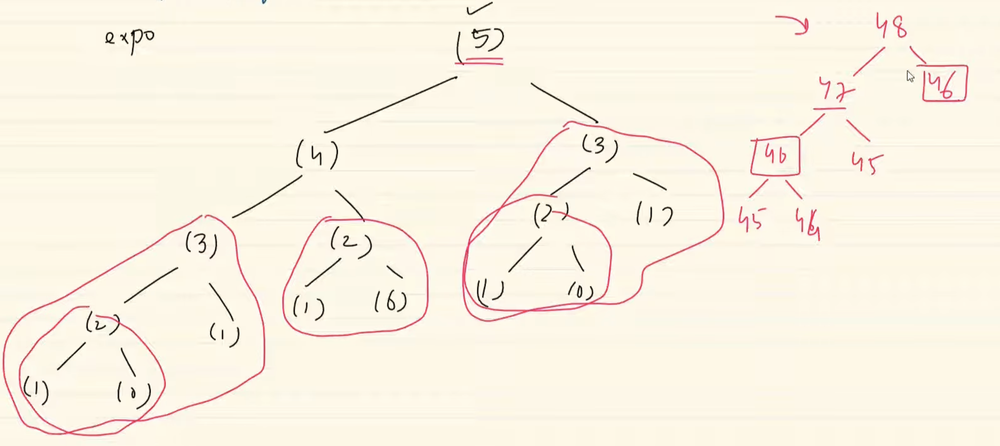
A simple recursive Fibonacci function calls itself repeatedly. Let me show you what happens when you calculate `fib(5)`:

```
                    fib(5)
                   /      \
              fib(4)       fib(3)
             /    \        /    \
         fib(3)  fib(2)  fib(2) fib(1)
        /    \   /   \   /   \
    fib(2) fib(1) ... and so on
```

**How many times is `fib(2)` calculated?** Multiple times! Each time the function is called with the same input, it recalculates everything from scratch.

**Why this is a problem:**

| Input Value | Approximate Time |
|-------------|------------------|
| 30 | 17 seconds |
| 38 | Minutes |
| 40 | Hours |
| 4000 | ~2 months (highly inefficient) |

The complexity grows **exponentially** – as input increases slightly, time increases dramatically.

### 3. Key Points

- Without memoization, recursive functions recompute the **same sub-problems repeatedly**
- Each number is recalculated many times (e.g., `fib(2)` calculated multiple times for a single `fib(5)` call)
- This leads to **exponential time complexity**
- As input grows, program becomes unusably slow

### 4. Code Example (Without Memoization)

```python
def fib(n):
    # Base cases: first two Fibonacci numbers
    if n <= 1:
        return n
    # Recursive calls: sum of previous two numbers
    return fib(n-1) + fib(n-2)

# To calculate fib(5)
result = fib(5)   # This will recalculate many values multiple times
```

**What happens when you run `fib(5)`:**
- It calls `fib(4)` and `fib(3)`
- `fib(4)` calls `fib(3)` and `fib(2)`
- `fib(3)` calls `fib(2)` and `fib(1)` – and `fib(2)` gets calculated **again** separately

### 5. Output Explanation (Mental Trace)

For `fib(5)`, calculations happen like this:
1. `fib(5)` needs `fib(4)` and `fib(3)`
2. `fib(4)` needs `fib(3)` and `fib(2)`
3. `fib(3)` (first time) needs `fib(2)` and `fib(1)`
4. `fib(3)` (second time, from step 2) needs `fib(2)` and `fib(1)` – **repeating work**

You can notice: to get `fib(5)`, you calculate `fib(3)` twice, `fib(2)` three times, etc.

### 6. Common Mistakes

| Mistake | Why It's Wrong | How to Avoid |
|---------|----------------|---------------|
| Using recursion without memoization for large inputs | Exponential time makes program unusable | Always add caching for recursive calculations |
| Thinking "small inputs work fine, so it's okay" | Works for n=10, fails for n=50 | Plan for worst-case input size |

### 7. Interview/Exam Questions

**Q: Why is the simple recursive Fibonacci inefficient?**
> *A: Because it recalculates the same Fibonacci numbers multiple times. For example, to calculate fib(5), fib(2) is calculated three times.*

**Q: If fib(40) takes minutes, what would happen at fib(50)?**
> *A: It would take exponentially longer – possibly hours or days – because each increase in n roughly doubles the work.*

**Q: What is the time complexity of naive recursive Fibonacci?**
> *A: Approximately O(2ⁿ) – exponential time. (The transcript mentions it grows so that 4000 could take 2 months.)*

### 8. Revision Notes

- **Fibonacci rule:** Each number = sum of previous two
- **Without memoization:** Same numbers recalculated many times
- **Example waste:** `fib(3)` calculated twice for `fib(5)`
- **Time grows fast:** n=30 → 17 seconds, n=38 → minutes
- **Root cause:** Repeated recomputation of same inputs
- **Solution needed:** Store results after first calculation

---



## Topic 3: Memoization Solution (Fibonacci with Caching)

### 1. Introduction

The solution to the inefficiency problem is **memoization** – store each calculated Fibonacci number in a dictionary (or cache) the first time it's computed. When the same number is needed again, simply look it up instead of recalculating.

**Why this is important:** It transforms an exponential-time algorithm into a linear-time one – from "takes months" to "takes milliseconds".

### 2. Detailed Explanation

**How memoization works for Fibonacci:**

1. Create an empty dictionary before starting
2. Every time you need `fib(n)`, first check if `n` already exists in the dictionary
3. If yes → immediately return the stored value (no recalculation)
4. If no → calculate it normally, then **store it in the dictionary** before returning

**Visual comparison:**

| Without Memoization | With Memoization |
|---------------------|------------------|
| fib(5) calculates fib(3) twice | fib(3) calculated once, then reused |
| fib(5) calculates fib(2) three times | fib(2) calculated once, then reused |
| Time grows exponentially | Time grows linearly |
| fib(38) takes minutes | fib(38) takes fractions of a second |
| fib(120) takes months | fib(120) takes same small time |

**The key insight:** Once you calculate `fib(40)`, you never need to calculate it again – just retrieve it from memory.

### 3. Key Points

- **Data structure used:** Dictionary (hash map) to store results
- **Process:** Check → if found return → else calculate, store, return
- **Result:** Dramatic speed improvement
- **Same time for 38, 120, or even larger inputs** (once cached)

### 4. Syntax/Structure (Code Explained)

The memoized function needs:
1. A dictionary parameter to store results
2. A check at the beginning to see if answer already exists
3. Storage of new results before returning

### 5. Code Example

**Basic memoized Fibonacci:**

```python
def fib_memo(n, memo):
    # Step 1: Check if already calculated
    if n in memo:
        return memo[n]  # Return cached result
    
    # Step 2: Base cases
    if n <= 1:
        return n
    
    # Step 3: Calculate (recursive with memo)
    result = fib_memo(n-1, memo) + fib_memo(n-2, memo)
    
    # Step 4: Store before returning
    memo[n] = result
    
    return result

# How to use it
my_cache = {}
answer = fib_memo(38, my_cache)  # Fast!
```

**More advanced version with wrapper:**

```python
def memoize_fib():
    cache = {}
    
    def fib(n):
        if n in cache:
            return cache[n]
        if n <= 1:
            return n
        cache[n] = fib(n-1) + fib(n-2)
        return cache[n]
    
    return fib

# Usage
fib = memoize_fib()
print(fib(38))   # Very fast
print(fib(120))  # Still fast - same time!
```

### 6. Output Explanation

**Without memoization:**
```
fib(38) takes 17 seconds
```

**With memoization:**
```
fib(38) takes ~0.001 seconds
fib(120) takes ~0.001 seconds (same!)
```

The time becomes nearly constant after the first computation because the function only calculates each number once, then just looks up the rest.

### 7. Common Mistakes

| Mistake | Why It's Wrong | How to Avoid |
|---------|----------------|---------------|
| Forgetting to pass the memo dictionary to recursive calls | New calculations won't be cached | Pass `memo` to every recursive call |
| Creating a new empty dictionary for each call | Cache resets every time, no benefit | Create dictionary **once** outside and reuse |
| Not checking the cache at the start of function | Still recalculates unnecessarily | Always check `if n in memo:` first |
| Using a list instead of dictionary | Lists are slower for this lookup | Use dictionary (hash map) for O(1) lookup |

### 8. Interview/Exam Questions

**Q: How would you implement memoization for Fibonacci?**
> *A: Create a dictionary. Before calculating fib(n), check if n is in the dictionary. If yes, return that value. If no, calculate recursively, store in dictionary, then return.*

**Q: What happens to time complexity after memoization?**
> *A: It drops from exponential O(2ⁿ) to linear O(n). Each number is calculated exactly once.*

**Q: What data structure is typically used for memoization and why?**
> *A: A dictionary (hash map) because it provides O(1) average lookup time to check if a result already exists.*

**Q: If fib(38) and fib(120) take the same time with memoization, why?**
> *A: Because both require calculating each Fibonacci number from 0 up to the target exactly once. The first call does the work; subsequent calls just look up results.*

### 9. Revision Notes

**Steps to memoize any function:**
1. Create a cache (dictionary)
2. At function start: check if input in cache → return if yes
3. Calculate result (possibly with recursive calls passing same cache)
4. Store result in cache
5. Return result

**Fibonacci-specific:**
- Cache key: input `n`
- Cache value: `fib(n)`
- After first run: all values 0..n stored
- Future calls: instant lookup

**Equation:**
```
Time without memoization → exponential
Time with memoization → linear
Speedup → massive (seconds vs months)
```

---


## Topic 4: Backpropagation Complexity Problem

### 1. Introduction

**Backpropagation** is the algorithm used to train neural networks – it calculates how much each weight contributed to the error, then updates the weights to improve the network.

The problem: In **deep neural networks** (networks with many layers), calculating these derivatives becomes extremely complex. The more layers you add, the more complicated and time-consuming the calculations become.

### 2. Detailed Explanation

**What is a neural network with multiple layers?**

A simple neural network structure:
- **Input layer** – receives the data
- **Hidden layers** – middle layers that process information
- **Output layer** – produces the final prediction

When you have multiple hidden layers (a "deep" network), calculating derivatives becomes difficult.

**Why is backpropagation complex in deep networks?**

To update a weight in an **early layer** (near the input), you need to consider:
- How that weight affects the first hidden layer
- How the first hidden layer affects the second hidden layer
- How the second hidden layer affects the third... and so on until the output

**The chain rule problem:**

Backpropagation uses the **chain rule** from calculus. For a deep network, the derivative for an early weight involves multiplying many terms together – one for each layer the signal passes through.

**Visual analogy:**

```
Input → Layer1 → Layer2 → Layer3 → Layer4 → Output
         ↑                              ↑
    Weight W1                    Loss calculation

To find how W1 affects Loss:
W1 → Layer1 → Layer2 → Layer3 → Layer4 → Loss
      (multiply) (multiply) (multiply) (multiply)
```

Each arrow represents a multiplication in the chain rule. More layers = more multiplications.

### 3. Key Points

| Shallow Network (few layers) | Deep Network (many layers) |
|------------------------------|---------------------------|
| Simple derivative calculation | Very complex derivatives |
| Short chain rule | Long chain rule (many terms to multiply) |
| Fast to compute | Slow to compute |
| Easy to implement | Requires optimization techniques |

### 4. The Specific Problem: Multiple Paths
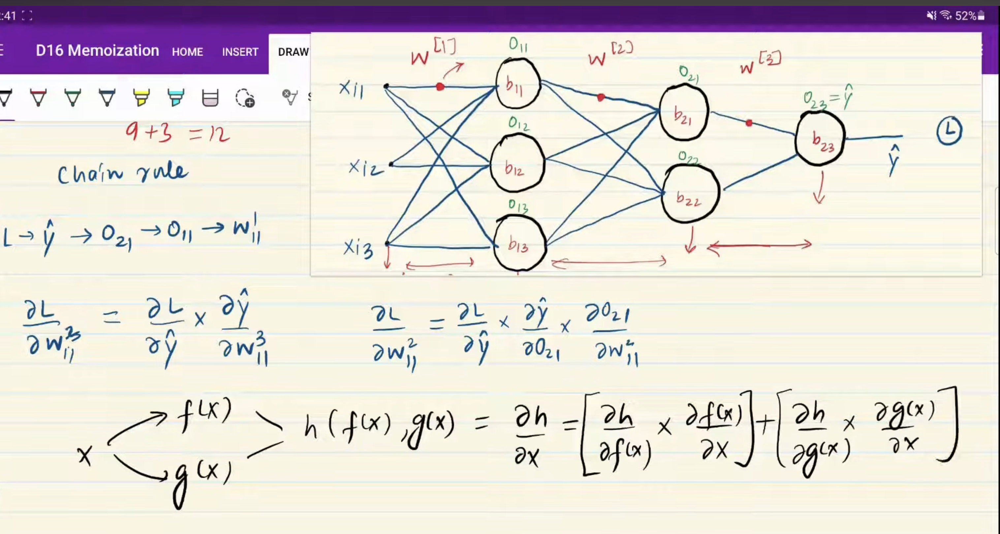
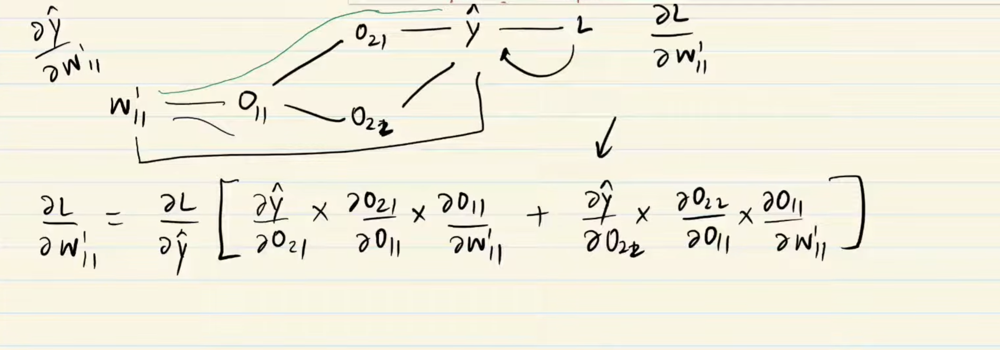
**Critical insight from the transcript:** In some network architectures, a weight can affect the output through **multiple paths**.

For example, a neuron's output might:
- Go directly toward the loss through one path
- Also go through another neuron toward the loss through a different path

This means the derivative becomes a **sum** of multiple chain rule applications:

```
Derivative = (Path 1 contribution) + (Path 2 contribution)
```

Where each path involves multiplying several derivatives together.

### 5. Common Mistakes

| Mistake | Why It's Wrong | How to Avoid |
|---------|----------------|---------------|
| Thinking backpropagation is simple for all networks | Works for shallow networks, fails for deep ones | Recognize complexity grows with depth |
| Ignoring multiple paths when calculating derivatives | You'll get the wrong derivative | Always sum contributions from all paths |
| Recalculating the same partial derivatives repeatedly | Wastes time | Use memoization (next topic) |

### 6. Interview/Exam Questions

**Q: Why does backpropagation become more complex in deep neural networks?**
> *A: Because the chain rule gets longer (more layers to backpropagate through) and in some architectures, a single weight can affect the output through multiple paths, requiring summation of multiple chain rule applications.*

**Q: What happens to training time as you add more hidden layers?**
> *A: Without optimization, training time increases significantly because derivatives become more complex to compute.*

**Q: What mathematical rule does backpropagation rely on?**
> *A: The chain rule from calculus.*

### 7. Revision Notes

- **Backpropagation** = algorithm for calculating weight derivatives in neural networks
- **Problem in deep networks:** Chain rule becomes very long
- **Additional complexity:** Some weights affect output through **multiple paths**
- **Result:** Many derivative calculations become necessary
- **Need:** A way to avoid recalculating the same derivatives repeatedly

---



## Topic 5: Using Memoization in Backpropagation

### 1. Introduction

Just as memoization sped up Fibonacci by storing repeated calculations, **memoization is used in backpropagation** to store derivatives that are calculated multiple times. When training deep neural networks, the same partial derivatives are needed repeatedly – memoization caches them so they don't need to be recomputed.

**Real-life use:** Modern deep learning libraries (like TensorFlow, PyTorch) use memoization techniques internally to make neural network training faster.

### 2. Detailed Explanation
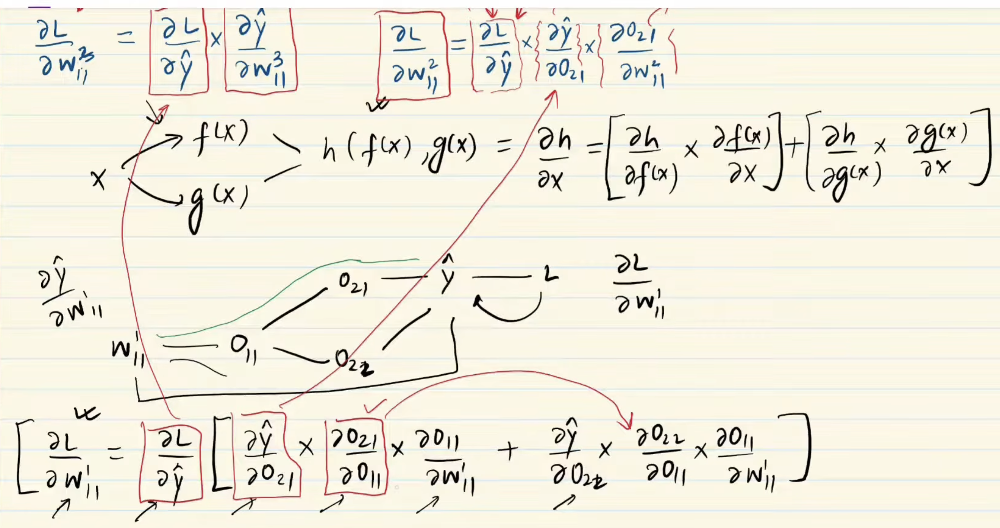
**The key insight:**

When you calculate derivatives starting from the output layer and moving backward, you naturally compute certain derivatives that are **reused** at earlier layers.

**Example from the transcript:**

In a deep network, when calculating the derivative for weight `W1` (early layer), you need certain intermediate derivatives:
- Derivative of layer 2's output with respect to layer 2's input
- Derivative of layer 3's output with respect to layer 3's input
- And so on...

These same intermediate derivatives are **also needed** when calculating derivatives for `W2`, `W3`, and other weights.

**Without memoization:** You recalculate these same derivatives each time you need them.

**With memoization:** Calculate once, store, reuse everywhere needed.

### 3. Visual Comparison

```
Without Memoization (Redundant Work):

W1 derivative → needs ∂L/∂h1, ∂h1/∂h2, ∂h2/∂h3
W2 derivative → needs ∂L/∂h2, ∂h2/∂h3          (recalculates ∂h2/∂h3)
W3 derivative → needs ∂L/∂h3, ∂h3/∂h4          (recalculates ∂h3/∂h4)

With Memoization (Efficient):

Calculate and store: ∂L/∂h3, ∂h3/∂h4
Then:
W3 derivative → look up stored values
W2 derivative → look up stored values (no recalculation)
W1 derivative → look up stored values (no recalculation)
```

### 4. How It Works Step by Step

**Step 1:** Start from the output layer (loss)

**Step 2:** Calculate derivative for the last layer's weights – store these results

**Step 3:** Move backward to the previous layer – when you need derivatives that were already calculated, retrieve them from storage instead of recomputing

**Step 4:** Continue backward – each step reuses previously computed derivatives

**The result:**
- Each derivative is calculated **exactly once**
- Training becomes **faster** (less computation)
- Memory usage increases slightly (storing derivatives)

### 5. Key Points

| Without Memoization in Backprop | With Memoization in Backprop |
|--------------------------------|------------------------------|
| Same derivative calculated many times | Each derivative calculated once |
| Training is slow | Training is faster |
| Worsens with more layers | Scales better with depth |
| Not used in professional libraries | Used in all modern deep learning libraries |

### 6. The Complete Picture

**Two components combine to make backpropagation efficient:**

1. **Chain Rule** (calculus) – tells you how to compute derivatives
2. **Memoization** (computer science) – tells you how to avoid recomputation

When you apply memoization to the chain rule calculations in backpropagation, you get the **efficient backpropagation algorithm** used in all modern neural network libraries.

### 7. Common Mistakes

| Mistake | Why It's Wrong | How to Avoid |
|---------|----------------|---------------|
| Thinking backpropagation is just the chain rule | Ignores the computational efficiency problem | Remember: chain rule + memoization = efficient backprop |
| Recalculating derivatives from scratch for each weight | Wastes massive time | Cache intermediate derivatives during backward pass |
| Not using automatic differentiation libraries | Reinventing the wheel, likely inefficient | Use frameworks like PyTorch/TensorFlow (they implement this for you) |

### 8. Interview/Exam Questions

**Q: How does memoization help in backpropagation?**
> *A: During backpropagation, the same partial derivatives are needed multiple times for different weights. Memoization stores each derivative the first time it's calculated, so subsequent uses simply look up the cached value instead of recomputing.*

**Q: What two concepts combine to make efficient backpropagation?**
> *A: The chain rule from calculus and memoization from computer science.*

**Q: Why does backpropagation naturally create reusable derivatives?**
> *A: Because when calculating derivatives backward from the output layer, intermediate derivatives (like ∂output/∂hidden) are needed for all weights that come before that point in the network.*

**Q: What is the trade-off when using memoization in backpropagation?**
> *A: Slightly more memory usage (storing derivatives) in exchange for significantly faster training time.*

### 9. Revision Notes

**The backpropagation + memoization formula:**

```
Efficient Backprop = Chain Rule + Memoization
```

**What gets cached:**
- Partial derivatives of layer outputs
- Intermediate gradient values

**Benefits:**
- Each derivative computed once
- Training deep networks becomes feasible
- Used in all major deep learning libraries

**Summary of whole playlist:**
| Topic | Main Takeaway |
|-------|---------------|
| Memoization | Store results → reuse → save time |
| Fibonacci problem | Without memo = exponential time |
| Memoized Fibonacci | With memo = linear time |
| Backprop problem | Deep networks = complex derivatives |
| Memoization in backprop | Cache derivatives → faster training |

---

**That completes all topics from the transcript.** You've covered:
1. What is Memoization
2. Fibonacci Problem (Inefficiency)
3. Memoization Solution (Fibonacci)
4. Backpropagation Complexity Problem
5. Using Memoization in Backpropagation

